In [ ]:
!nvidia-smi

Mon Aug 24 17:59:03 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### This notebook shows how several deep learning techniques can help classify human activity based on measurements from cell phone accelerometer and gyroscope. Explored techniques include a 1-dimensional convolution neural network, bi-LSTM neural network, and signal processing + convolution neural network. 

# Data Preparation

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
%load_ext tensorboard

In [ ]:
# cnn model
import numpy as np
from numpy import mean
from numpy import std
from numpy import dstack
from pandas import read_csv
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout, Bidirectional, LSTM, Dropout, Activation
from keras.layers.convolutional import Conv1D, MaxPooling1D, Conv2D, MaxPooling2D
from keras.utils import to_categorical
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
print(f"TensorFlow version: {tf.__version__}")
from tensorboard.plugins.hparams import api as hp
import os

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc

#from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint

TensorFlow version: 2.3.0


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# EDA

In [ ]:
column_names = ['user_id', 'activity', 'timestamp', 'x_axis', 'y_axis', 'z_axis']

df = pd.read_csv('WISDM_ar_v1.1_raw.txt', header=None, names=column_names)
df.z_axis.replace(regex=True, inplace=True, to_replace=r';', value=r'')
df['z_axis'] = df.z_axis.astype(np.float64)
df.dropna(axis=0, how='any', inplace=True)

In [ ]:
df.head()

,user_id,activity,timestamp,x_axis,y_axis,z_axis
0,33,Jogging,49105962326000,-0.694638,12.680544,0.503953
1,33,Jogging,49106062271000,5.012288,11.264028,0.953424
2,33,Jogging,49106112167000,4.903325,10.882658,-0.081722
3,33,Jogging,49106222305000,-0.612916,18.496431,3.023717
4,33,Jogging,49106332290000,-1.184970,12.108489,7.205164


In [ ]:
df.shape

(1098203, 6)

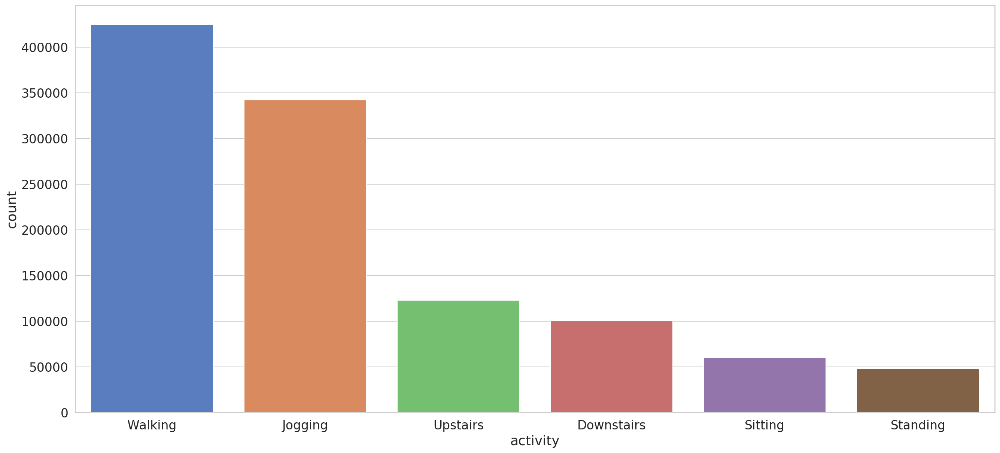

In [ ]:
sns.countplot(x = 'activity',
              data = df,
              order = df.activity.value_counts().index);

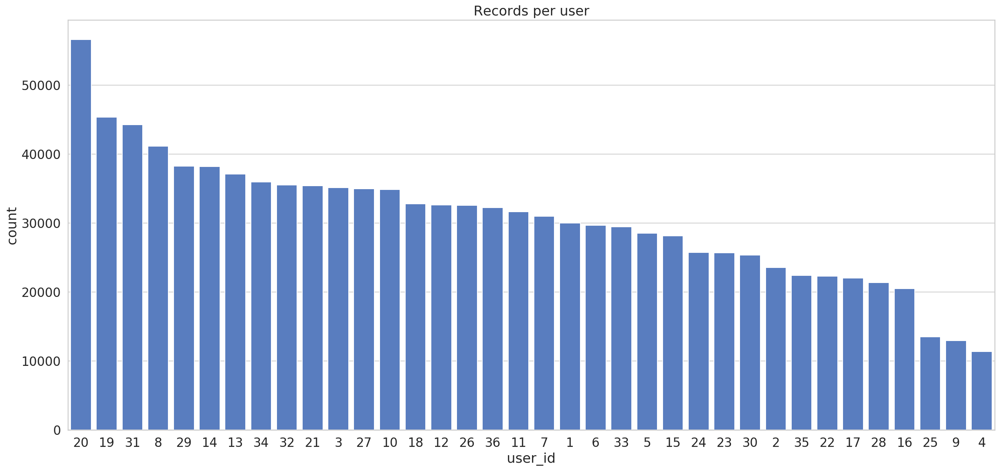

In [ ]:
sns.countplot(x = 'user_id',
              data = df,
              palette=[sns.color_palette()[0]],
              order = df.user_id.value_counts().index);
plt.title("Records per user");

In [ ]:
def plot_activity(activity, df):
    data = df[df['activity'] == activity][['x_axis', 'y_axis', 'z_axis']][:200]
    axis = data.plot(subplots=True, figsize=(16, 12), 
                     title=activity)
    for ax in axis:
        ax.legend(loc='lower left', bbox_to_anchor=(1.0, 0.5))

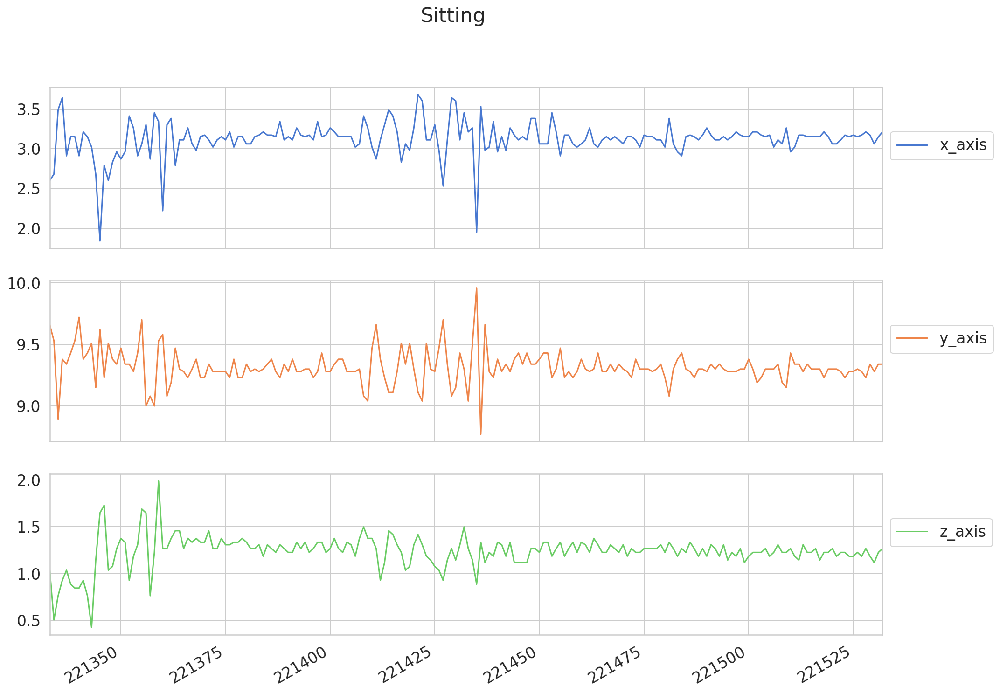

In [ ]:
plot_activity("Sitting", df);

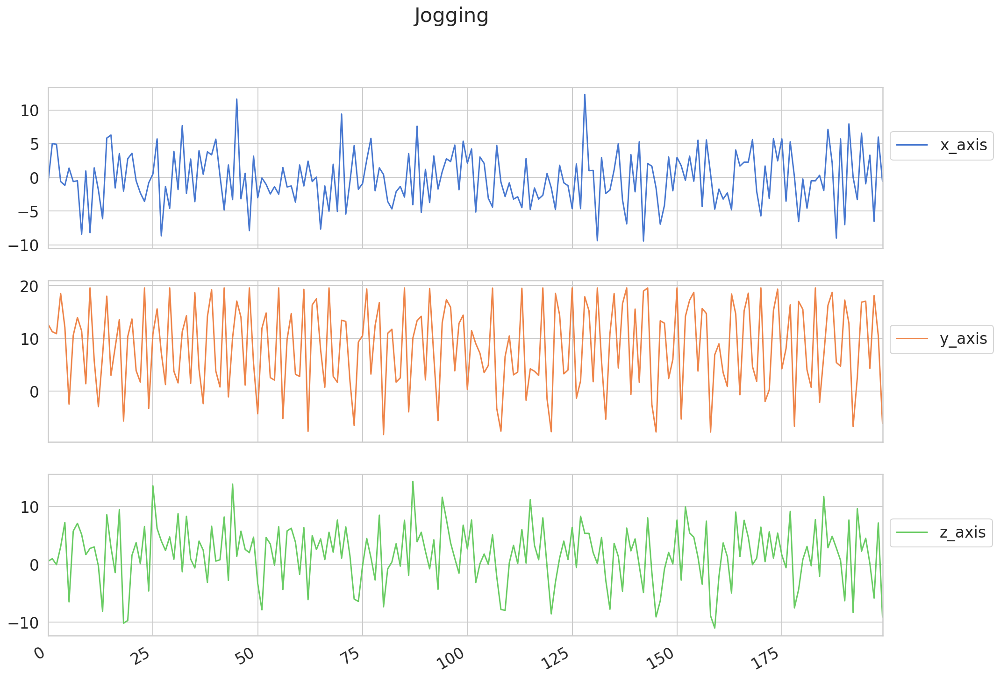

In [ ]:
plot_activity("Jogging", df);

# Data preparetion for machine learning

In [ ]:
# load a single file as a numpy array
def load_file(filepath):
    dataframe = read_csv(filepath, header=None, delim_whitespace=True)
    return dataframe.values

In [ ]:
# load a list of files and return as a 3d numpy array
def load_group(filenames, prefix='drive/My Drive/'):
    loaded = list()
    for name in filenames:
      data = load_file(prefix + name)
      loaded.append(data)
    # stack group so that features are the 3rd dimension
    loaded = dstack(loaded)
    return loaded

In [ ]:
# load the dataset, returns train and test X and y elements
def load_dataset(prefix='drive/My Drive/'):
    # load all train
    trainX, trainy = load_dataset_group('train', prefix + 'HARDataset/')
    print(trainX.shape, trainy.shape)
    # load all test
    testX, testy = load_dataset_group('test', prefix + 'HARDataset/')
    print(testX.shape, testy.shape)
    # zero-offset class values
    trainy = trainy - 1
    testy = testy - 1
    # one hot encode y
    trainy = to_categorical(trainy)
    testy = to_categorical(testy)
    print(trainX.shape, trainy.shape, testX.shape, testy.shape)
    return trainX, trainy, testX, testy

In [ ]:
# standardize data
def scale_data(trainX, testX, standardize):
    # remove overlap
    cut = int(trainX.shape[1] / 2)
    longX = trainX[:, -cut:, :]
    # flatten windows
    longX = longX.reshape((longX.shape[0] * longX.shape[1], longX.shape[2]))
    # flatten train and test
    flatTrainX = trainX.reshape((trainX.shape[0] * trainX.shape[1], trainX.shape[2]))
    flatTestX = testX.reshape((testX.shape[0] * testX.shape[1], testX.shape[2]))
    # standardize
    if standardize:
      s = StandardScaler()
      # fit on training data
      s.fit(longX)
      # apply to training and test data
      longX = s.transform(longX)
      flatTrainX = s.transform(flatTrainX)
      flatTestX = s.transform(flatTestX)
    # reshape
    flatTrainX = flatTrainX.reshape((trainX.shape))
    flatTestX = flatTestX.reshape((testX.shape))
    return flatTrainX, flatTestX

In [ ]:
from sklearn.metrics import confusion_matrix

def plot_cm(y_true, y_pred, class_names):
  cm = confusion_matrix(y_true, y_pred)
  fig, ax = plt.subplots(figsize=(18, 16)) 
  ax = sns.heatmap(
      cm, 
      annot=True, 
      fmt="d", 
      cmap=sns.diverging_palette(220, 20, n=7),
      ax=ax
  )

  plt.ylabel('Actual')
  plt.xlabel('Predicted')
  ax.set_xticklabels(class_names)
  ax.set_yticklabels(class_names)
  b, t = plt.ylim() # discover the values for bottom and top
  b += 0.5 # Add 0.5 to the bottom
  t -= 0.5 # Subtract 0.5 from the top
  plt.ylim(b, t) # update the ylim(bottom, top) values
  plt.show() # ta-da!

# 1D-CNN model

In [ ]:
HP_FILTERS = hp.HParam('filters', hp.Discrete([32,64]))
HP_KERNEL_SIZE = hp.HParam('kernel_size', hp.Discrete([3,5]))
#HP_STANDARDIZE = hp.HParam('standardize', hp.Discrete([True]))

METRIC_ACCURACY = 'accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_FILTERS, HP_KERNEL_SIZE],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

In [ ]:
# fit and evaluate a model
def evaluate_model_1D_CNN(trainX, trainy, testX, testy, hparams):
    verbose, epochs, batch_size = 0, 10, 32
    n_timesteps, n_features, n_outputs = trainX.shape[1], trainX.shape[2], trainy.shape[1]
    # scale data
    trainX, testX = scale_data(trainX, testX, True)
    model = Sequential()
    model.add(Conv1D(filters=hparams[HP_FILTERS], kernel_size=hparams[HP_KERNEL_SIZE], activation='relu', input_shape=(n_timesteps,n_features)))
    model.add(Conv1D(filters=hparams[HP_FILTERS], kernel_size=hparams[HP_KERNEL_SIZE], activation='relu'))
    model.add(Dropout(0.5))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(n_outputs, activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    # fit network
    model.fit(trainX, trainy, epochs=epochs, batch_size=batch_size, verbose=verbose)
    # evaluate model
    _, accuracy = model.evaluate(testX, testy, batch_size=batch_size, verbose=0)
    return model, accuracy

In [ ]:
def run(run_dir, trainX, trainy, testX, testy, hparams):
    with tf.summary.create_file_writer(run_dir).as_default():
        hp.hparams(hparams)  # record the values used in this trial
        model, accuracy = evaluate_model_1D_CNN(trainX, trainy, testX, testy, hparams)
        tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)
    return model, accuracy

In [ ]:
trainX, trainy, testX, testy = load_dataset()
train_model=False
if train_model:
    session_num = 0
    accuracy_max=-1
    for filters in HP_FILTERS.domain.values:
        for kernel_size in HP_KERNEL_SIZE.domain.values:
            hparams = {
                HP_FILTERS: filters,
                HP_KERNEL_SIZE: kernel_size,
            }
            run_name = "run-%d" % session_num
            print('--- Starting trial: %s' % run_name)
            print({h.name: hparams[h] for h in hparams})
            model, accuracy = run('logs/hparam_tuning/' + run_name, trainX, trainy, testX, testy, hparams)
            if accuracy>accuracy_max:
                model.save('drive/My Drive/best_model/1D_CNN_model')
            session_num += 1

(7352, 128, 9) (7352, 1)
(2947, 128, 9) (2947, 1)
(7352, 128, 9) (7352, 6) (2947, 128, 9) (2947, 6)


In [ ]:
trainX, testX = scale_data(trainX, testX, True)
best_model = tf.keras.models.load_model('drive/My Drive/best_model/1D_CNN_model')
y_pred=best_model.predict(testX)

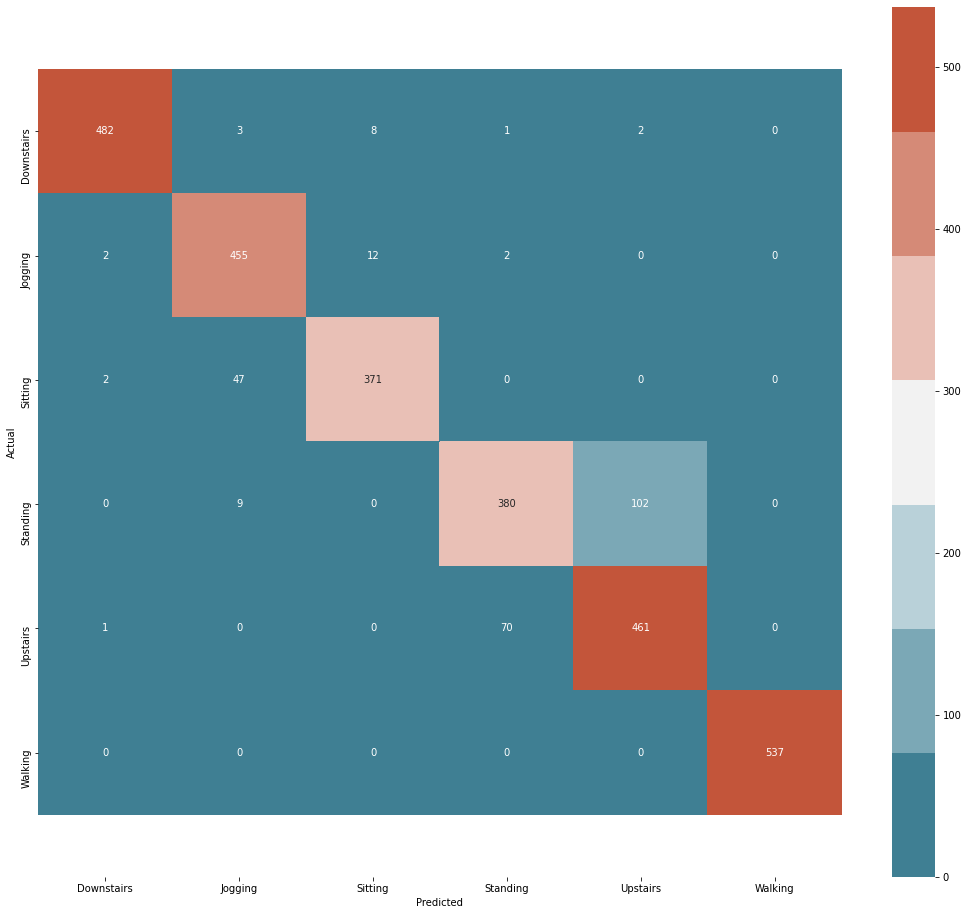

In [ ]:
class_names=np.array(['Downstairs', 'Jogging', 'Sitting', 'Standing', 'Upstairs',
       'Walking'], dtype='<U10')
plot_cm(
  np.argmax(testy,axis=1)+1,
  np.argmax(y_pred,axis=1)+1,
  class_names
)

In [ ]:
%tensorboard --logdir logs/hparam_tuning

<IPython.core.display.Javascript object>

# Bi-LSTM model

In [ ]:
HP_UNITS = hp.HParam('units', hp.Discrete([128]))
HP_DROPOUT = hp.HParam('dropout', hp.Discrete([0.5]))
#HP_STANDARDIZE = hp.HParam('standardize', hp.Discrete([True]))

METRIC_ACCURACY = 'accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_UNITS, HP_DROPOUT],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

In [ ]:
def evaluate_model_Bi_LSTM(trainX, trainy, testX, testy, hparams):
    verbose, epochs, batch_size = 0, 10, 32
    n_timesteps, n_features, n_outputs = trainX.shape[1], trainX.shape[2], trainy.shape[1]
    # scale data
    trainX, testX = scale_data(trainX, testX, True)
    model = Sequential()
    model.add(
        Bidirectional(
          LSTM(
              units=hparams[HP_UNITS], 
              input_shape=[trainX.shape[1], trainX.shape[2]]
          )
        )
    )
    model.add(Dropout(rate=hparams[HP_DROPOUT]))
    model.add(Dense(units=hparams[HP_UNITS], activation='relu'))
    model.add(Dense(trainy.shape[1], activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    # new data
    history = model.fit(
        trainX, trainy,
        epochs=epochs,
        batch_size=64,
        validation_split=0.1,
        shuffle=True
        #callbacks=[cp_callback]
    )
    # evaluate model
    _, accuracy = model.evaluate(testX, testy, batch_size=batch_size, verbose=0)
    return model, accuracy

In [ ]:
def run(run_dir, trainX, trainy, testX, testy, hparams):
    with tf.summary.create_file_writer(run_dir).as_default():
        hp.hparams(hparams)  # record the values used in this trial
        model, accuracy = evaluate_model_Bi_LSTM(trainX, trainy, testX, testy, hparams)
        tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)
    return model, accuracy

In [ ]:
trainX, trainy, testX, testy = load_dataset()
session_num = 0
accuracy_max=-1
train_model=False
if train_model:
  for units in HP_UNITS.domain.values:
    for dropout in HP_DROPOUT.domain.values:
      for standardize in HP_STANDARDIZE.domain.values:
        hparams = {
            HP_UNITS: units,
            HP_DROPOUT: dropout,
        }
        run_name = "run-%d" % session_num
        print('--- Starting trial: %s' % run_name)
        print({h.name: hparams[h] for h in hparams})
        model, accuracy = run('logs/hparam_tuning/' + run_name, trainX, trainy, testX, testy, hparams)
        if accuracy>accuracy_max:
            model.save('drive/My Drive/best_model/Bi_LSTM_model')
        session_num += 1

(7352, 128, 9) (7352, 1)
(2947, 128, 9) (2947, 1)
(7352, 128, 9) (7352, 6) (2947, 128, 9) (2947, 6)
--- Starting trial: run-0
{'units': 128, 'dropout': 0.5, 'standardize': True}
Train on 6616 samples, validate on 736 samples
Epoch 1/10
6616/6616 [==============================] - 64s 10ms/step - loss: 0.6537 - accuracy: 0.7523 - val_loss: 0.2196 - val_accuracy: 0.9280
Epoch 2/10
6616/6616 [==============================] - 64s 10ms/step - loss: 0.2037 - accuracy: 0.9265 - val_loss: 0.2594 - val_accuracy: 0.8682
Epoch 3/10
6616/6616 [==============================] - 63s 10ms/step - loss: 0.1409 - accuracy: 0.9433 - val_loss: 0.2634 - val_accuracy: 0.8845
Epoch 4/10
6616/6616 [==============================] - 63s 10ms/step - loss: 0.1689 - accuracy: 0.9333 - val_loss: 0.1307 - val_accuracy: 0.9158
Epoch 5/10
6616/6616 [==============================] - 62s 9ms/step - loss: 0.1789 - accuracy: 0.9368 - val_loss: 0.1233 - val_accuracy: 0.9171
Epoch 6/10
6616/6616 [========================

In [ ]:
trainX, testX = scale_data(trainX, testX, True)
best_model = tf.keras.models.load_model('drive/My Drive/best_model/Bi_LSTM_model')
y_pred=best_model.predict(testX)

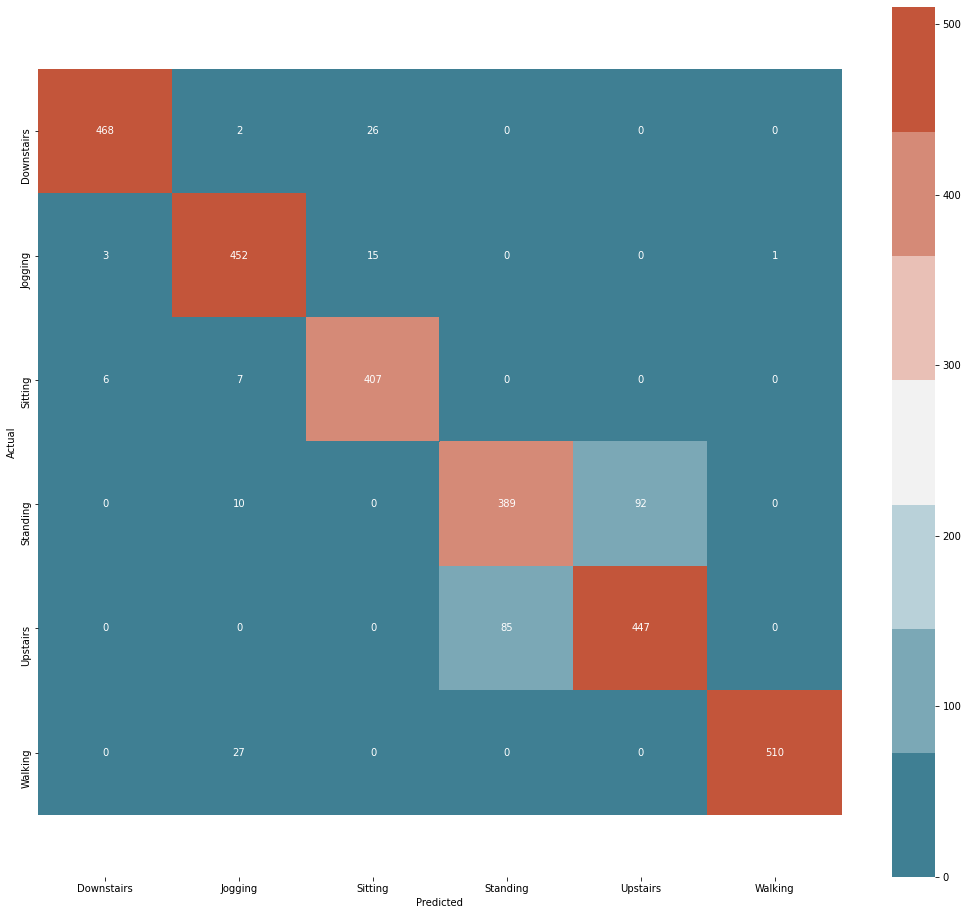

In [ ]:
class_names=np.array(['Downstairs', 'Jogging', 'Sitting', 'Standing', 'Upstairs',
       'Walking'], dtype='<U10')
plot_cm(
  np.argmax(testy,axis=1)+1,
  np.argmax(y_pred,axis=1)+1,
  class_names
)

In [ ]:
%tensorboard --logdir logs/hparam_tuning

Reusing TensorBoard on port 6006 (pid 3630), started 0:01:18 ago. (Use '!kill 3630' to kill it.)

<IPython.core.display.Javascript object>

# Wavelet transform (signal processing)

In [ ]:
import pywt
import matplotlib.pyplot as plt
trainX, trainy, testX, testy = load_dataset()

(7352, 128, 9) (7352, 1)
(2947, 128, 9) (2947, 1)
(7352, 128, 9) (7352, 6) (2947, 128, 9) (2947, 6)


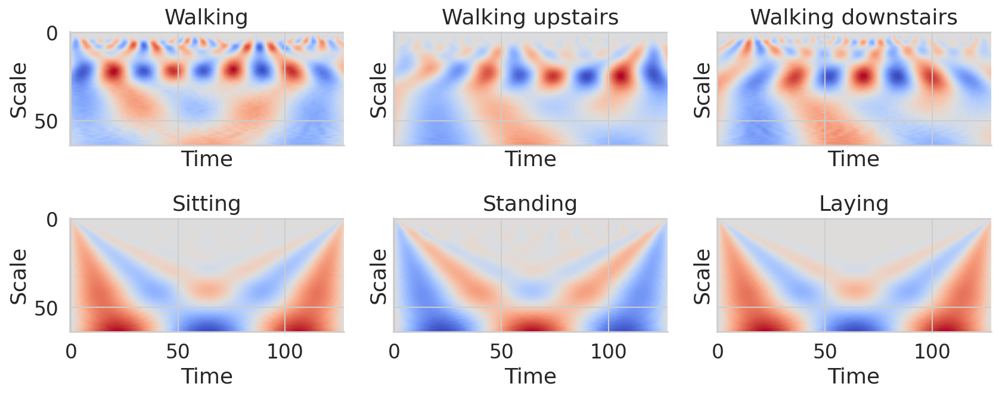

In [ ]:
def plot_cwt_coeffs_per_label(X, label_indicies, label_names, signal, sample, scales, wavelet):
    
    fig, axs = plt.subplots(nrows=2, ncols=3, sharex=True, sharey=True, figsize=(12,5))
    
    for ax, indices, name in zip(axs.flat, label_indicies, label_names):
        # apply  PyWavelets continuous wavelet transfromation function
        coeffs, freqs = pywt.cwt(X[indices[sample],:, signal], scales, wavelet = wavelet)
        # create scalogram
        ax.imshow(coeffs, cmap = 'coolwarm', aspect = 'auto')
        ax.set_title(name)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.set_ylabel('Scale')
        ax.set_xlabel('Time')
    plt.tight_layout()

# list of list of sample indicies per activity
train_labels_indicies = split_indices_per_label(y_train)

#signal indicies: 0 = body acc x, 1 = body acc y, 2 = body acc z, 3 = body gyro x, 4 = body gyro y, 5 = body gyro z, 6 = total acc x, 7 = total acc y, 8 = total acc z
signal = 3 # signal index
sample = 1 # sample index of each label indicies list
scales = np.arange(1, 65) # range of scales
wavelet = 'gausP' # mother wavelet

plot_cwt_coeffs_per_label(X_train, train_labels_indicies, LABEL_NAMES, signal, sample, scales, wavelet)

In [ ]:
perform_wavelet_transform=False
wavelet_name="gaus1"

if perform_wavelet_transform:
    from skimage.transform import resize

    def create_cwt_images(X, n_scales, rescale_size, wavelet_name):#morl#gausP,mexh
        n_samples = X.shape[0] 
        n_signals = X.shape[2] 
        
        # range of scales from 1 to n_scales
        scales = np.arange(1, n_scales + 1) 
        
        # pre allocate array
        X_cwt = np.ndarray(shape=(n_samples, rescale_size, rescale_size, n_signals), dtype = 'float32')
        
        for sample in range(n_samples):
            if sample % 1000 == 0:
                print(sample)
            for signal in range(n_signals):
                serie = X[sample, :, signal]
                # continuous wavelet transform 
                coeffs, freqs = pywt.cwt(serie, scales, wavelet_name)
                # resize the 2D cwt coeffs
                rescale_coeffs = resize(coeffs, (rescale_size, rescale_size), mode = 'constant')
                X_cwt[sample,:,:,signal] = rescale_coeffs
                
        return X_cwt
      
    # amount of pixels in X and Y 
    rescale_size = 64
    # determine the max scale size
    n_scales = 64
    X_train_cwt = create_cwt_images(trainX, n_scales, rescale_size, wavelet_name)
    print(f"shapes (n_samples, x_img, y_img, z_img) of X_train_cwt: {X_train_cwt.shape}")
    X_test_cwt = create_cwt_images(testX, n_scales, rescale_size, wavelet_name)
    print(f"shapes (n_samples, x_img, y_img, z_img) of X_test_cwt: {X_test_cwt.shape}")

    np.save('drive/My Drive/X_train_cwt_'+wavelet_name+'.npy',X_train_cwt)
    np.save('drive/My Drive/X_test_cwt_'+wavelet_name+'.npy',X_test_cwt)

else:
    X_train_cwt=np.load('drive/My Drive/X_train_cwt_'+wavelet_name+'.npy')
    X_test_cwt=np.load('drive/My Drive/X_test_cwt_'+wavelet_name+'.npy')

In [ ]:
def evaluate_model_wavelet_CNN(trainy, testy, hparams):
    wavelet_name=hparams[HP_WAVELET]
    allData=np.load('drive/My Drive/X_train_cwt_'+wavelet_name+'.npy')
    trainX=allData[:5800,:,:,:]
    testX=allData[5800:,:,:,:]

    verbose, epochs, batch_size = 1, 10, 368
    input_shape = (trainX.shape[1], trainX.shape[2], trainX.shape[3])
    # scale data
    #trainX, testX = scale_data(trainX, testX, True)
    model = Sequential()
    
    # 2 Convolution layer with Max polling
    model.add(Conv2D(32, 5, activation = "relu", padding = 'same', input_shape = input_shape))
    model.add(MaxPooling2D())
    model.add(Conv2D(64, 5, activation = "relu", padding = 'same', kernel_initializer = "he_normal"))
    model.add(MaxPooling2D())  
    model.add(Flatten())
    
    # 3 Full connected layer
    model.add(Dense(128, activation = "relu", kernel_initializer = "he_normal"))
    model.add(Dense(54, activation = "relu", kernel_initializer = "he_normal"))
    model.add(Dense(6, activation = 'softmax')) # 6 classes

    # compile the model
    #model.compile(
    #    optimizer=tf.keras.optimizers.Adam(),
    #    loss='sparse_categorical_crossentropy',
    #    metrics=['sparse_categorical_accuracy'])
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    # define callbacks
    #callbacks = [ModelCheckpoint(filepath='drive/My Drive/best_model.h5', monitor='val_sparse_categorical_accuracy', save_best_only=True)]
    
    # fit the model
    '''
    history = model.fit(x=trainX,
                        y=trainy,
                        batch_size=batch_size,
                        epochs=n_epochs,
                        validation_split=0.2,
                        shuffle=True,
                        verbose=1)#,
                        #callbacks=callbacks,
                        #validation_data=(X_test, y_test))
    '''

    model.fit(trainX, trainy, epochs=epochs, batch_size=batch_size, verbose=verbose)
    _, accuracy = model.evaluate(testX, testy, batch_size=batch_size, verbose=1)
    return model, accuracy

In [ ]:
HP_WAVELET = hp.HParam('wavelet', hp.Discrete(["morl","mexh","gaus1"]))
#HP_KERNEL_SIZE = hp.HParam('kernel_size', hp.Discrete([3,5]))
#HP_STANDARDIZE = hp.HParam('standardize', hp.Discrete([True]))

METRIC_ACCURACY = 'accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_WAVELET],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

In [ ]:
def run(run_dir, trainy, testy, hparams):
    with tf.summary.create_file_writer(run_dir).as_default():
        hp.hparams(hparams)  # record the values used in this trial
        model, accuracy = evaluate_model_wavelet_CNN(trainy, testy, hparams)
        tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)
    return model, accuracy

In [ ]:
_, ally, _, _ = load_dataset()
trainy=ally[:5800]
testy=ally[5800:]
train_model=True
if train_model:
    session_num = 0
    accuracy_max=-1
    for wavelet in HP_WAVELET.domain.values:
        hparams = {
            HP_WAVELET: wavelet
        }
        run_name = "run-%d" % session_num
        print('--- Starting trial: %s' % run_name)
        print({h.name: hparams[h] for h in hparams})
        
        model, accuracy = run('logs/hparam_tuning/' + run_name, trainy, testy, hparams)
        if accuracy>accuracy_max:
            model.save('drive/My Drive/best_model/wavelet_CNN_model')
            np.save('drive/My Drive/best_model/best_wavelet.npy',str(hparams[HP_WAVELET]))
        session_num += 1

In [ ]:
best_model = tf.keras.models.load_model('drive/My Drive/best_model/wavelet_CNN_model')
best_wavelet=np.load('drive/My Drive/best_model/best_wavelet.npy')[()]
allData=np.load('drive/My Drive/X_train_cwt_'+best_wavelet+'.npy')
trainX=allData[:5800,:,:,:]
testX=allData[5800:,:,:,:]
y_pred=best_model.predict(testX)

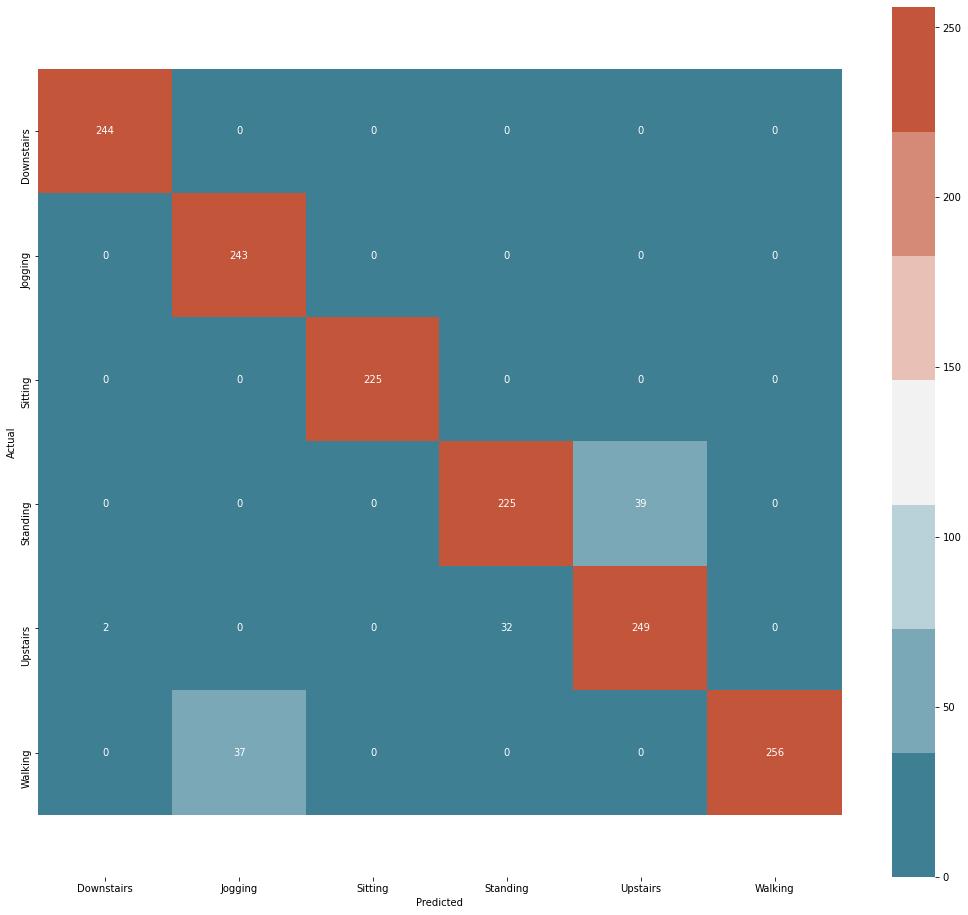

In [ ]:
class_names=np.array(['Downstairs', 'Jogging', 'Sitting', 'Standing', 'Upstairs',
       'Walking'], dtype='<U10')
plot_cm(
  np.argmax(testy,axis=1)+1,
  np.argmax(y_pred,axis=1)+1,
  class_names
)